In [29]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import cooler
import bioframe
import cooltools
import cooltools.lib.plotting
from matplotlib.colors import LogNorm
from matplotlib.ticker import EngFormatter
bp_formatter = EngFormatter('b')
from mpl_toolkits.axes_grid import make_axes_locatable
from skimage.filters import threshold_li, threshold_otsu
import bbi
import random
import warnings
warnings.filterwarnings('ignore')

In [30]:
clr_mau2 = cooler.Cooler('/DATA/users/magnitov/tacl/hic/coolers/T-MAU2.hg38.mapq_30.1000.mcool::/resolutions/10000')
clr_dox = cooler.Cooler('/DATA/users/magnitov/tacl/hic/coolers/T-MAU2_Dox_1H.hg38.mapq_30.1000.mcool::/resolutions/10000')
clr_mcherry = cooler.Cooler('/DATA/users/magnitov/tacl/hic/coolers/T-mCherry.hg38.mapq_30.1000.mcool::/resolutions/10000')
clr_haarhuis = cooler.Cooler('/DATA/users/magnitov/tacl/hic/coolers/haarhuis_2017.WT.hg38.mapq_30.1000.mcool::/resolutions/10000')
clr_sanborn = cooler.Cooler('/DATA/users/magnitov/tacl/hic/coolers/sanborn_2015.WT.hg38.mapq_30.1000.mcool::/resolutions/10000')

In [31]:
hg38_chromsizes = bioframe.fetch_chromsizes('hg38')
hg38_cens = bioframe.fetch_centromeres('hg38')
hg38_arms = bioframe.make_chromarms(hg38_chromsizes, hg38_cens)
hg38_arms = hg38_arms.set_index("chrom").loc[clr_mau2.chromnames].reset_index()

In [32]:
expected_mau2 = cooltools.expected_cis(clr_mau2, view_df = hg38_arms, nproc = 16)
expected_mcherry = cooltools.expected_cis(clr_mcherry, view_df = hg38_arms, nproc = 16)
expected_dox = cooltools.expected_cis(clr_dox, view_df = hg38_arms, nproc = 16)
expected_haarhuis = cooltools.expected_cis(clr_haarhuis, view_df = hg38_arms, nproc = 16)
expected_sanborn = cooltools.expected_cis(clr_sanborn, view_df = hg38_arms, nproc = 16)

In [33]:
def get_sites_stack_diagonal(sites, cooler, expected, view, flank = 500_000):
    mask = np.array(sites.strand == '-', dtype = bool)
    stack = cooltools.pileup(cooler, sites, view_df = view, expected_df=expected, flank = flank, nproc = 16)
    stack[:, :, mask] = stack[::-1, ::-1, mask]
    mtx = np.nanmean(stack, axis = 2)
    
    return(mtx)

def get_sites_stack_off_diagonal(sites, cooler, expected, view, flank = 500_000):
    stack = cooltools.pileup(cooler, sites, view_df = view, expected_df=expected, flank = flank, nproc = 16)
    mtx = np.nanmean(stack, axis=2)
    return(mtx)

In [34]:
teto = bioframe.read_table('tetO_integrations.bed', schema = 'bed').query(f'chrom in {clr_mau2.chromnames}')
teto

,chrom,start,end,name,score,strand
0,chr1,237830986,237830987,139.837513,great,3
1,chr2,51872342,51872343,49.004590,good,26
2,chr3,33400162,33400163,149.103374,great,1
3,chr3,53376827,53376828,85.785791,good,10
4,chr4,110494148,110494149,64.357880,great,17
5,chr4,111934793,111934794,60.428193,good,19
6,chr5,34372940,34372941,18.707535,good,27
7,chr5,129667933,129667934,64.777732,good,16
8,chr6,66566401,66566402,57.091667,great,21
9,chr7,75997722,75997723,68.584146,good,14


In [35]:
mtx_mau2_teto = get_sites_stack_diagonal(teto, clr_mau2, expected_mau2, hg38_arms)
mtx_dox_teto = get_sites_stack_diagonal(teto, clr_dox, expected_dox, hg38_arms)
mtx_mcherry_teto = get_sites_stack_diagonal(teto, clr_mcherry, expected_mcherry, hg38_arms)
mtx_haarhuis_teto = get_sites_stack_diagonal(teto, clr_haarhuis, expected_haarhuis, hg38_arms)
mtx_sanborn_teto = get_sites_stack_diagonal(teto, clr_sanborn, expected_sanborn, hg38_arms)

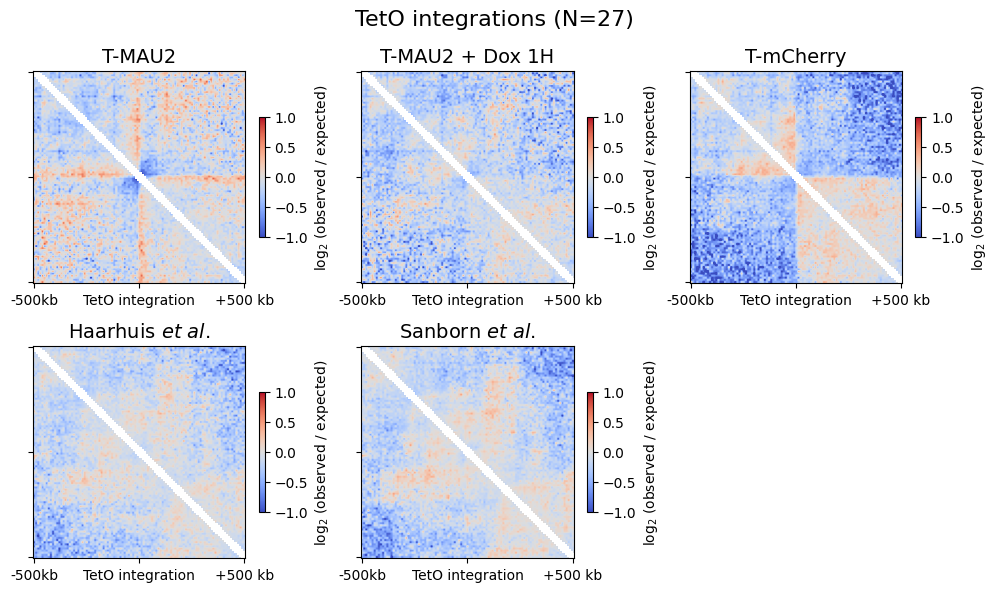

In [36]:
plt.figure(figsize = (10, 6))
plt.suptitle('TetO integrations (N=' + str(len(teto)) + ')', fontsize = 16)

plt.subplot(231)
plt.title('T-MAU2', fontsize = 14)
plt.imshow(np.log2(mtx_mau2_teto), vmin = -1, vmax = 1, cmap = 'coolwarm', interpolation=None)
plt.xticks([0, 50, 100], ['-500kb', 'TetO integration', '+500 kb'])
plt.yticks([0, 50, 100], ['', '', ''])
plt.colorbar(label = 'log$_2$ (observed / expected)', shrink = 0.5)

plt.subplot(232)
plt.title('T-MAU2 + Dox 1H', fontsize = 14)
plt.imshow(np.log2(mtx_dox_teto), vmin = -1, vmax = 1, cmap = 'coolwarm', interpolation=None)
plt.xticks([0, 50, 100], ['-500kb', 'TetO integration', '+500 kb'])
plt.yticks([0, 50, 100], ['', '', ''])
plt.colorbar(label = 'log$_2$ (observed / expected)', shrink = 0.5)

plt.subplot(233)
plt.title('T-mCherry', fontsize = 14)
plt.imshow(np.log2(mtx_mcherry_teto), vmin = -1, vmax = 1, cmap = 'coolwarm', interpolation=None)
plt.xticks([0, 50, 100], ['-500kb', 'TetO integration', '+500 kb'])
plt.yticks([0, 50, 100], ['', '', ''])
plt.colorbar(label = 'log$_2$ (observed / expected)', shrink = 0.5)

plt.subplot(234)
plt.title('Haarhuis $et$ $al$.', fontsize = 14)
plt.imshow(np.log2(mtx_haarhuis_teto), vmin = -1, vmax = 1, cmap = 'coolwarm', interpolation=None)
plt.xticks([0, 50, 100], ['-500kb', 'TetO integration', '+500 kb'])
plt.yticks([0, 50, 100], ['', '', ''])
plt.colorbar(label = 'log$_2$ (observed / expected)', shrink = 0.5)

plt.subplot(235)
plt.title('Sanborn $et$ $al$.', fontsize = 14)
plt.imshow(np.log2(mtx_sanborn_teto), vmin = -1, vmax = 1, cmap = 'coolwarm', interpolation=None)
plt.xticks([0, 50, 100], ['-500kb', 'TetO integration', '+500 kb'])
plt.yticks([0, 50, 100], ['', '', ''])
plt.colorbar(label = 'log$_2$ (observed / expected)', shrink = 0.5)

plt.tight_layout()
plt.savefig('/DATA/users/magnitov/tacl/figures/teto_pileups.pdf', bbox_inches = 'tight')
plt.show()

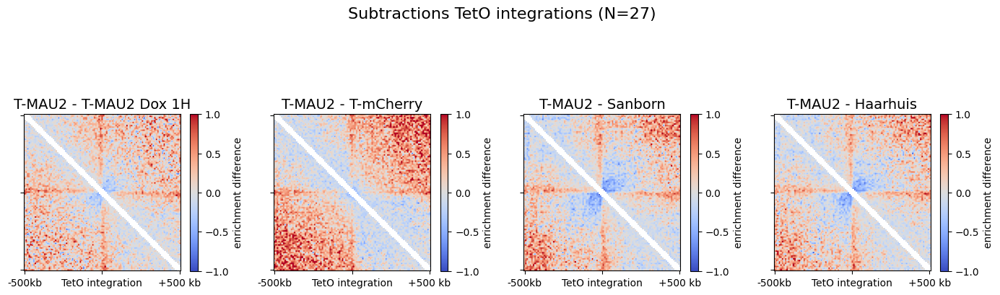

In [38]:
plt.figure(figsize = (14, 5))
plt.suptitle('Subtractions TetO integrations (N=' + str(len(teto)) + ')', fontsize = 16)

plt.subplot(141)
plt.title('T-MAU2 - T-MAU2 Dox 1H', fontsize = 14)
plt.imshow(np.log2(mtx_mau2_teto)-np.log2(mtx_dox_teto), vmin = -1, vmax = 1, cmap = 'coolwarm', interpolation=None)
plt.xticks([0, 50, 100], ['-500kb', 'TetO integration', '+500 kb'])
plt.yticks([0, 50, 100], ['', '', ''])
plt.colorbar(label = 'enrichment difference', shrink = 0.5)

plt.subplot(142)
plt.title('T-MAU2 - T-mCherry', fontsize = 14)
plt.imshow(np.log2(mtx_mau2_teto)-np.log2(mtx_mcherry_teto), vmin = -1, vmax = 1, cmap = 'coolwarm', interpolation=None)
plt.xticks([0, 50, 100], ['-500kb', 'TetO integration', '+500 kb'])
plt.yticks([0, 50, 100], ['', '', ''])
plt.colorbar(label = 'enrichment difference', shrink = 0.5)

plt.subplot(143)
plt.title('T-MAU2 - Sanborn', fontsize = 14)
plt.imshow(np.log2(mtx_mau2_teto)-np.log2(mtx_sanborn_teto), vmin = -1, vmax = 1, cmap = 'coolwarm', interpolation=None)
plt.xticks([0, 50, 100], ['-500kb', 'TetO integration', '+500 kb'])
plt.yticks([0, 50, 100], ['', '', ''])
plt.colorbar(label = 'enrichment difference', shrink = 0.5)

plt.subplot(144)
plt.title('T-MAU2 - Haarhuis', fontsize = 14)
plt.imshow(np.log2(mtx_mau2_teto)-np.log2(mtx_haarhuis_teto), vmin = -1, vmax = 1, cmap = 'coolwarm', interpolation=None)
plt.xticks([0, 50, 100], ['-500kb', 'TetO integration', '+500 kb'])
plt.yticks([0, 50, 100], ['', '', ''])
plt.colorbar(label = 'enrichment difference', shrink = 0.5)

plt.tight_layout()
plt.savefig('/DATA/users/magnitov/tacl/figures/teto_pileups_subtractions.pdf', bbox_inches = 'tight')
plt.show()

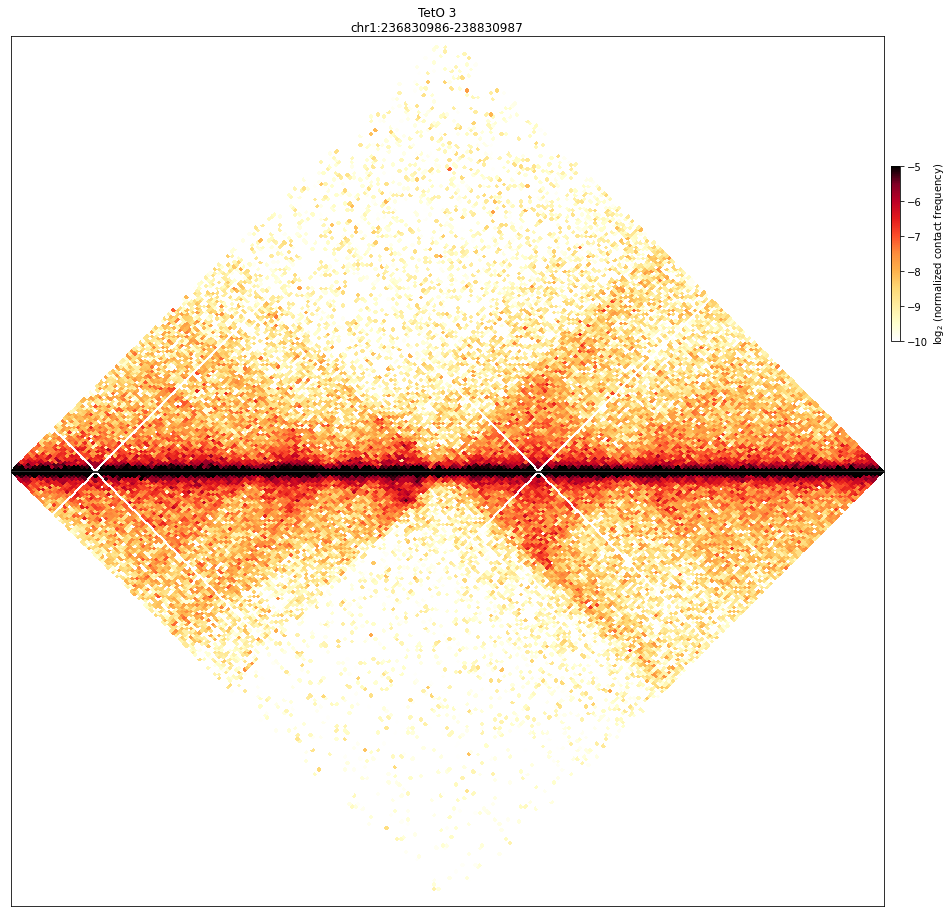

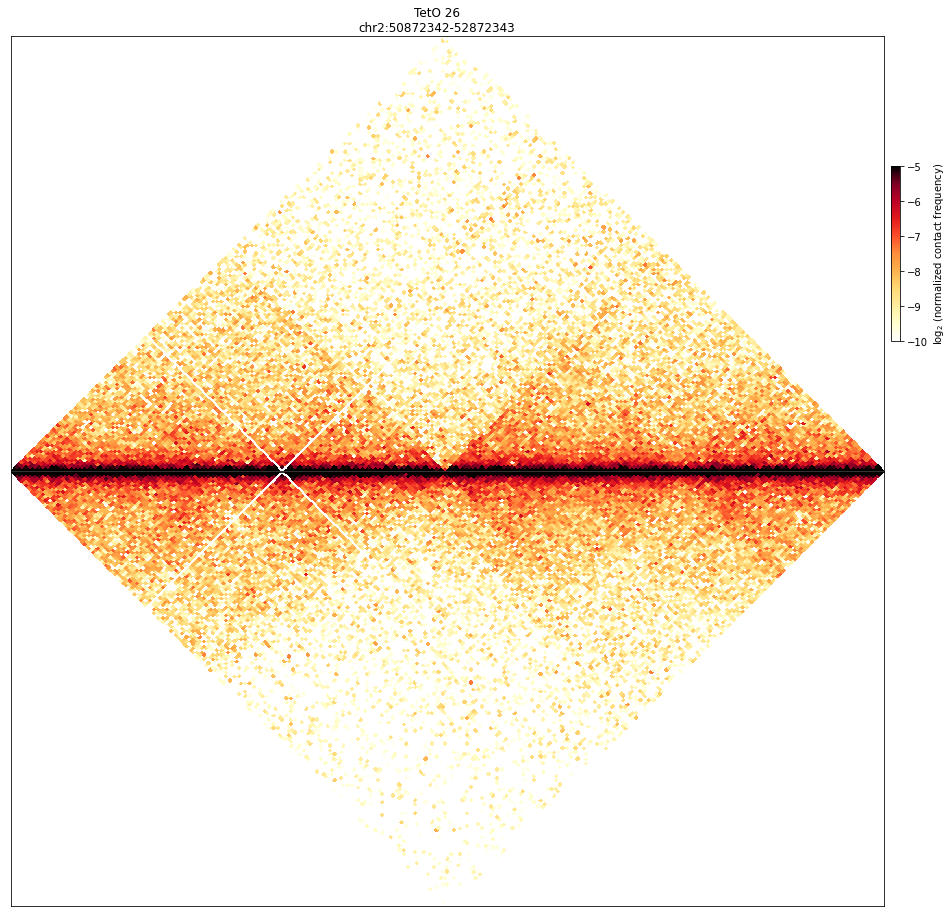

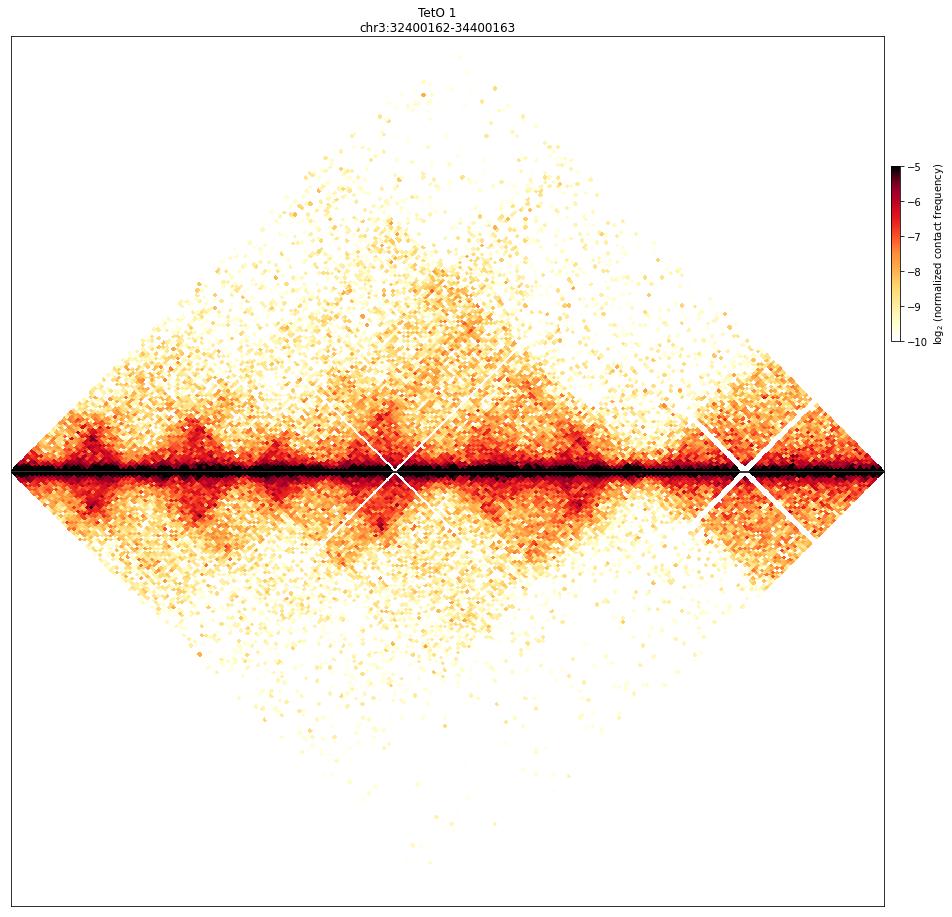

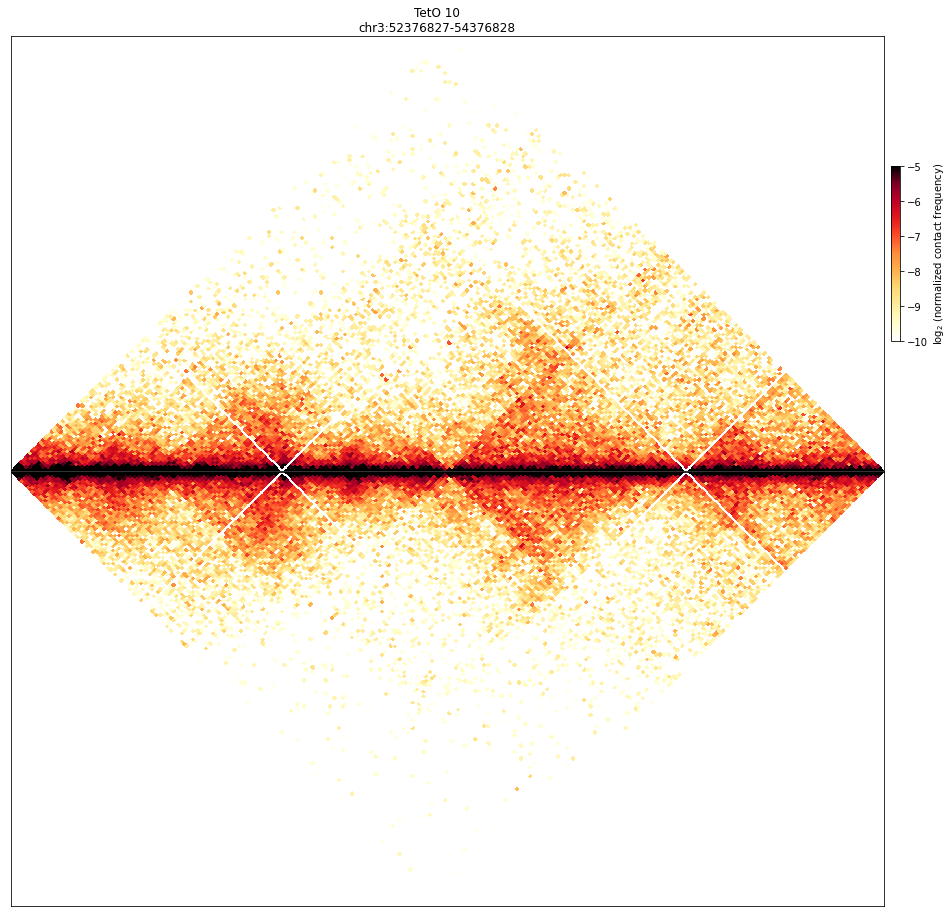

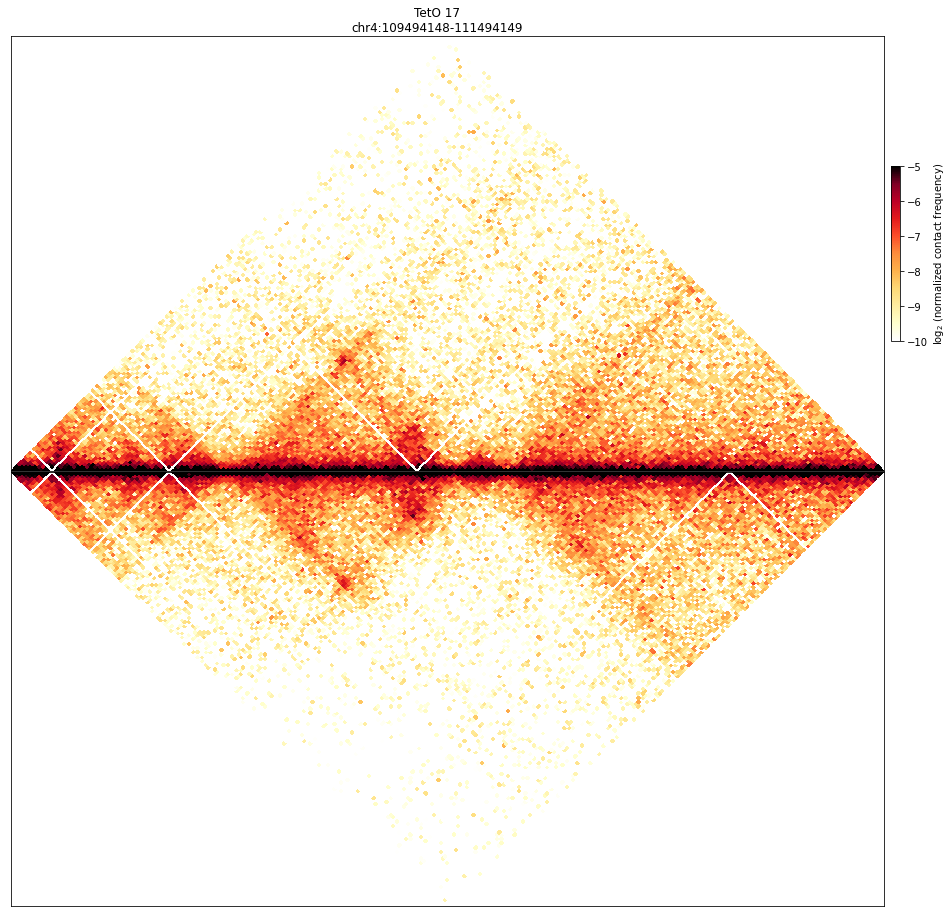

...

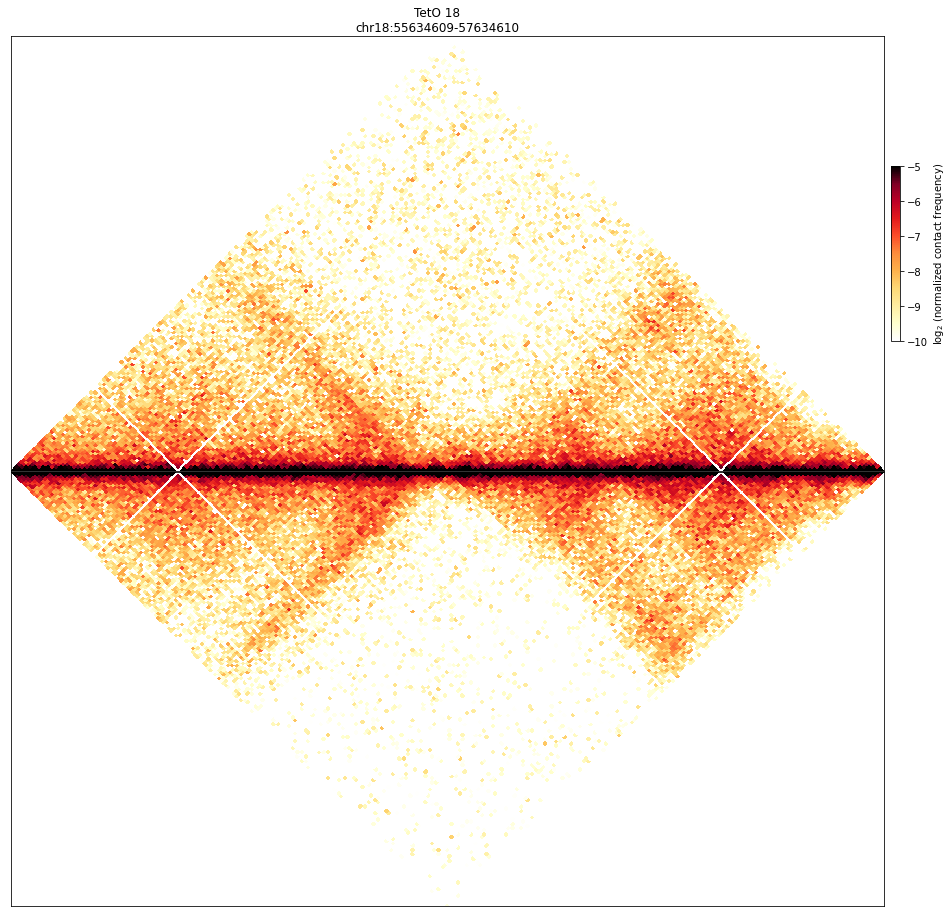

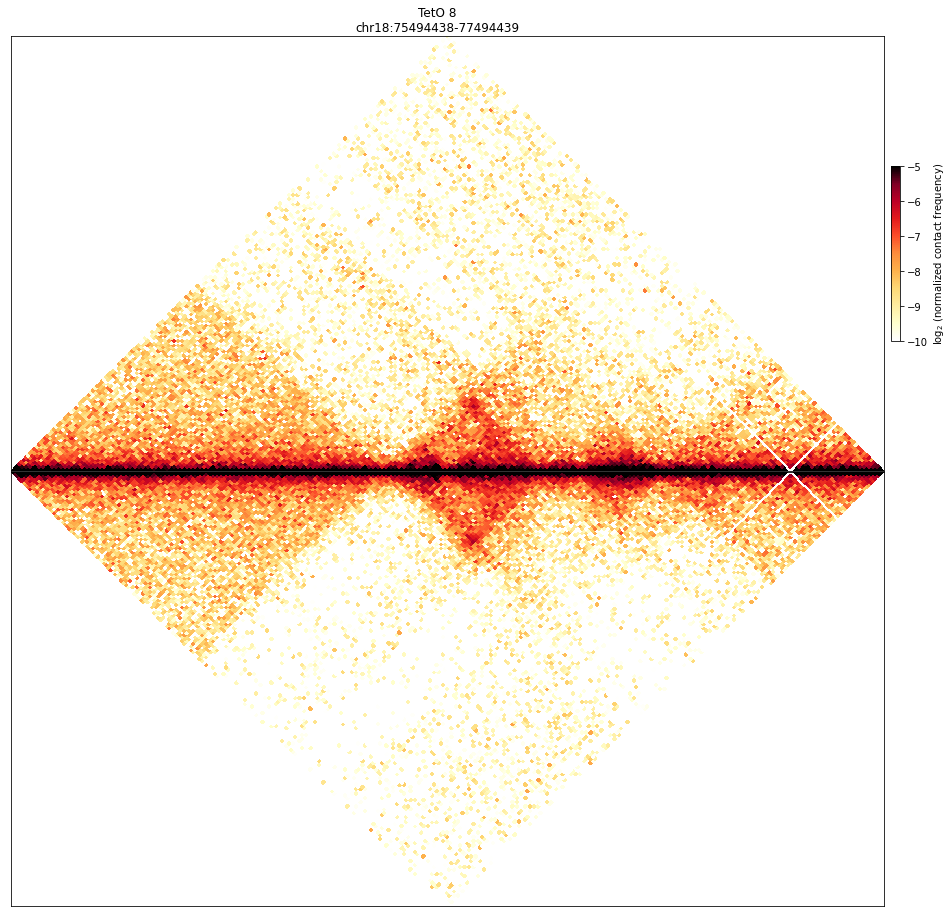

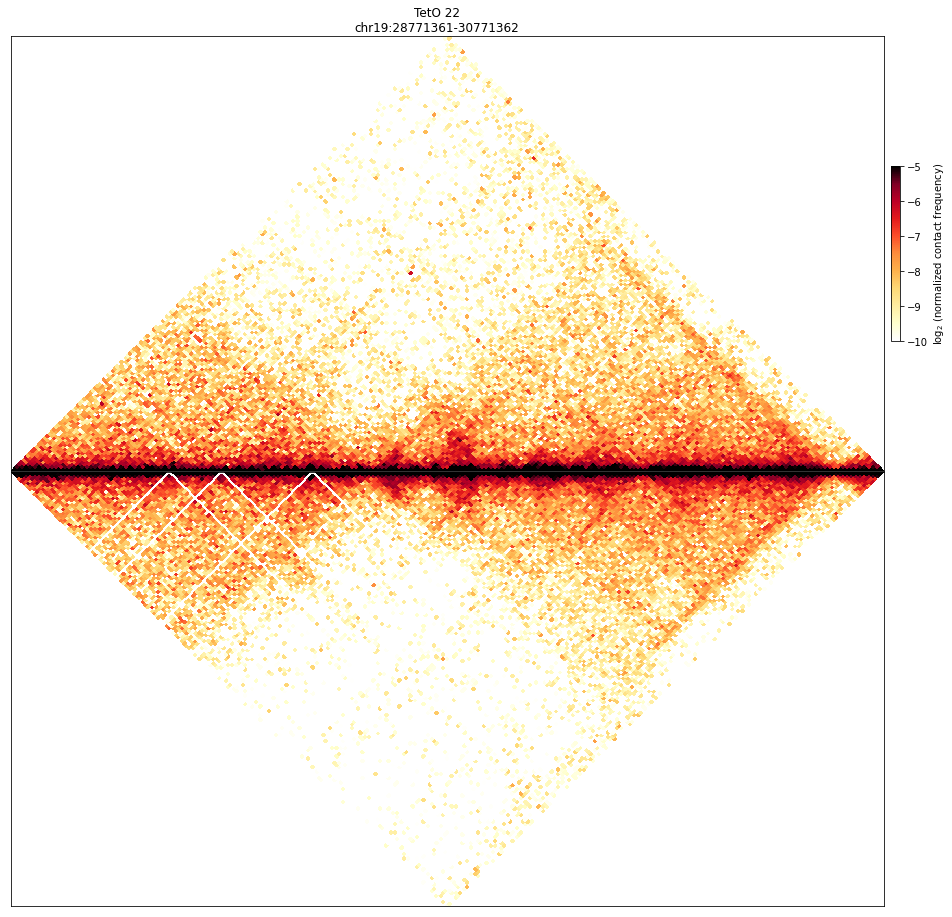

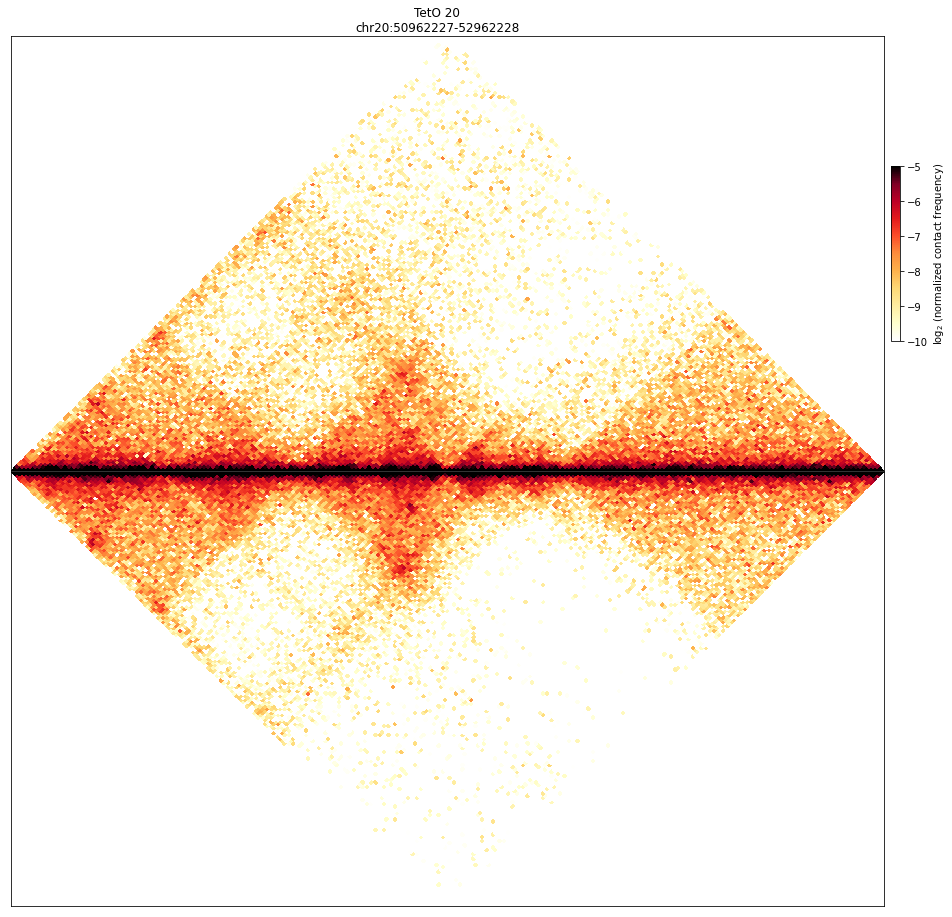

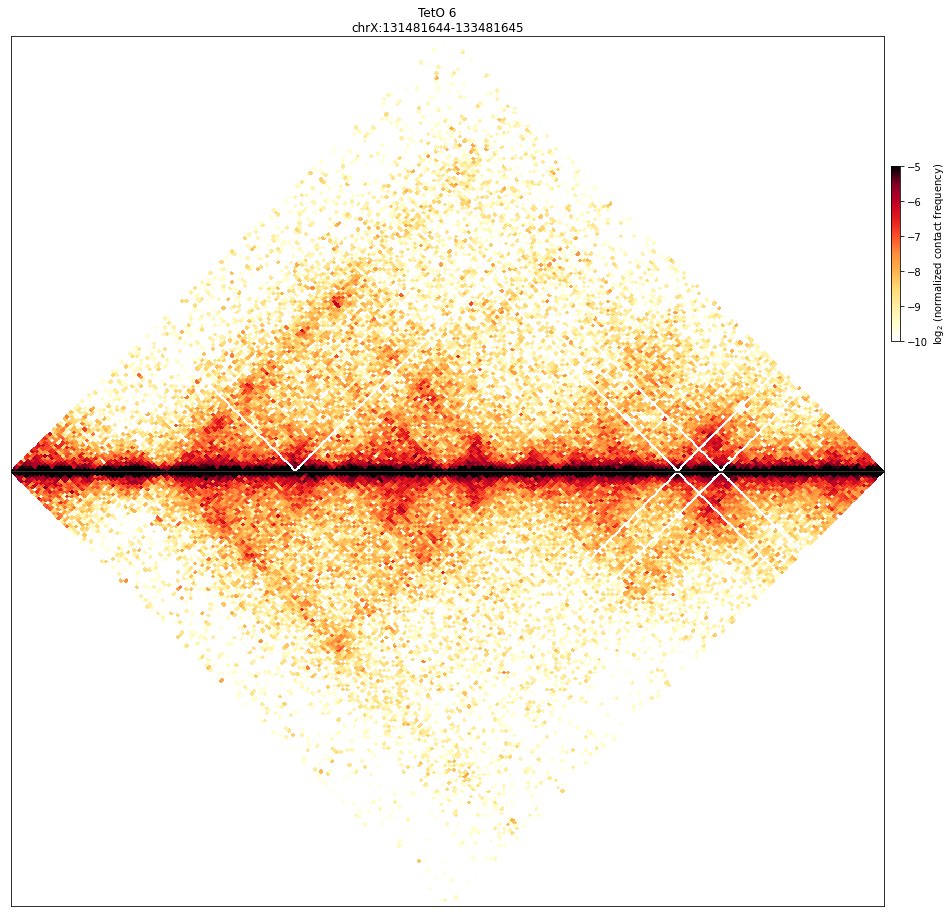

In [94]:
for integration in teto.values:

    region = (integration[0], integration[1]-1000000, integration[2]+1000000)
    data_mau2 = clr_mau2.matrix(balance = True).fetch(region)
    data_mcherry = clr_mcherry.matrix(balance = True).fetch(region)
    
    f, ax = plt.subplots(figsize = (20, 20))
    
    plt.suptitle('TetO ' + str(integration[5]) + '\n' + integration[0] + ':' + str(integration[1]-1000000) + '-' + str(integration[2]+1000000), y = 0.75)
    
    im1 = pcolormesh_45deg(ax, np.log2(data_mau2), start = region[1], resolution = 10000, 
                           vmax = -5, vmin = -10, cmap = 'fall')
    ax.set_aspect(0.5)
    ax.set_ylim(0, 2000000)
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size = "1%", pad = 0.1, aspect = 20)
    plt.colorbar(im1, label = 'log$_2$ (normalized contact frequency)', cax = cax)
    
    
    ins_ax = divider.append_axes("bottom", size = "50%", pad = -3, sharex = ax)
    ins_ax.set_prop_cycle(plt.cycler("color", plt.cm.plasma(np.linspace(0, 1, 6))))

    im2 = pcolormesh_45deg(ins_ax, np.log2(data_mcherry), start = region[1], resolution = 10000, 
                           vmax = -5, vmin = -10, cmap = 'fall')
    ins_ax.set_aspect(0.5)
    ins_ax.set_ylim(-2000000, 0)
    format_ticks(ins_ax, rotate = False)
    ins_ax.xaxis.set_visible(False)
    ins_ax.yaxis.set_visible(False)
    
    plt.savefig('./paper_figures/5_side_to_side_TetO_' + str(integration[5]) + '_T-MAU2_vs_T-mCherry_higlass.pdf', dpi = 600)